# in this Phase we will read the data from MongoDB and do data visualization for it using Python libraries

# import the libraries

In [1]:
import scipy.stats as stats
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from pymongo import MongoClient
import seaborn as sns
import plotly.express as px
from bokeh.plotting import figure, show
import geopandas as gpd
import altair as alt
#to ignore warnings
import warnings
warnings.filterwarnings('ignore')

# Read the date from MongoDB

In [2]:
client = MongoClient("mongodb://localhost:27017/")
client.list_database_names()

['admin', 'config', 'fifa_database', 'local']

In [3]:
# List all collection names in the database
db = client['fifa_database']
collection_names = db.list_collection_names()
collection_names

['fifa_players']

In [4]:
# Specify the collection name
collection_name = 'fifa_players'

# Check if the collection exists
if collection_name in db.list_collection_names():
    # Fetch all documents in the collection
    cursor = db[collection_name].find()

    # Convert the documents to a Pandas DataFrame
    df = pd.DataFrame(list(cursor))

    # Display the DataFrame
    print("DataFrame:")
df.head()

DataFrame:


,_id,Player ID,Name,Card Title,Club,Nation,League,Foot,Skill Moves,Weak Foot,...,Heading Accuracy,Defensive Awareness,Standing Tackle,Sliding_Tackle_list,Physicality,Jumping,Stamina,Strength_list,AggressionLowest BIN,gender
0,65888bb61d4ce5b6a18e8185,270735,Aakash Sangwan,Aakash Sangwan Common 56 OVR,Chennaiyin Fc,India,Hero Indian Super League,Left,2,4,...,35,52,56,54,56,49,63,56,50,Male
1,65888bb61d4ce5b6a18e8186,234290,Aapo Halme,Aapo Halme Rare 65 OVR,Hjk Helsinki,Finland,Finnliiga,Right,2,3,...,66,60,62,62,71,70,58,78,71,Male
2,65888bb61d4ce5b6a18e8187,259218,Aaren D'Silva,Aaren D'Silva Common 51 OVR,Hyderabad Fc,India,Hero Indian Super League,Right,2,3,...,48,12,16,11,60,61,34,76,53,Male
3,65888bb61d4ce5b6a18e8188,275440,Aaron Akal,Aaron Akal Common 54 OVR,Fc Basel 1893,France,Credit Suisse Super League,Right,3,3,...,49,14,16,14,47,51,38,52,46,Male
4,65888bb61d4ce5b6a18e8189,270603,Aaron Basenach,Aaron Basenach Common 56 OVR,Kaiserslautern,Germany,Bundesliga 2,Right,2,3,...,50,52,54,51,56,58,60,55,54,Male


In [5]:
# Close the MongoDB connection
# client.close()

In [6]:
df = pd.read_csv(r"Full cleand fifa players 2.csv", sep=';')
df.head()

,Player ID,Name,Card Title,Club,Nation,League,Foot,Skill Moves,Weak Foot,AcceleRATE,...,Heading Accuracy,Defensive Awareness,Standing Tackle,Sliding_Tackle_list,Physicality,Jumping,Stamina,Strength_list,AggressionLowest BIN,gender
0,270735,Aakash Sangwan,Aakash Sangwan Common 56 OVR,Chennaiyin Fc,India,Hero Indian Super League,Left,2,4,Controlled,...,35,52,56,54,56,49,63,56,50,Male
1,234290,Aapo Halme,Aapo Halme Rare 65 OVR,Hjk Helsinki,Finland,Finnliiga,Right,2,3,Controlled lengthy,...,66,60,62,62,71,70,58,78,71,Male
2,259218,Aaren D'Silva,Aaren D'Silva Common 51 OVR,Hyderabad Fc,India,Hero Indian Super League,Right,2,3,Controlled lengthy,...,48,12,16,11,60,61,34,76,53,Male
3,275440,Aaron Akal,Aaron Akal Common 54 OVR,Fc Basel 1893,France,Credit Suisse Super League,Right,3,3,Controlled,...,49,14,16,14,47,51,38,52,46,Male
4,270603,Aaron Basenach,Aaron Basenach Common 56 OVR,Kaiserslautern,Germany,Bundesliga 2,Right,2,3,Controlled,...,50,52,54,51,56,58,60,55,54,Male


In [7]:
df.isnull().sum()

Player ID               0
Name                    0
Card Title              0
Club                    0
Nation                  0
League                  0
Foot                    0
Skill Moves             0
Weak Foot               0
AcceleRATE              0
Height                  0
Att/Def. WR             0
Age                     0
Player Card Link        0
Pace                    0
Acceleration            0
Sprint Speed            0
AcceleRATE_1            0
Shooting                0
Positioning             0
Finishing               0
Shot Power              0
Long Shots              0
Volleys                 0
Penalties               0
Passing                 0
Vision                  0
Crossing                0
FK Accuracy             0
Short Passing           0
Long Passing            0
Curve                   0
Dribbling               0
Agility                 0
Balance                 0
Reactions               0
Ball Control            0
Dribbling_2             0
Composure   

In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13678 entries, 0 to 13677
Data columns (total 51 columns):
 #   Column                Non-Null Count  Dtype 
---  ------                --------------  ----- 
 0   Player ID             13678 non-null  int64 
 1   Name                  13678 non-null  object
 2   Card Title            13678 non-null  object
 3   Club                  13678 non-null  object
 4   Nation                13678 non-null  object
 5   League                13678 non-null  object
 6   Foot                  13678 non-null  object
 7   Skill Moves           13678 non-null  int64 
 8   Weak Foot             13678 non-null  int64 
 9   AcceleRATE            13678 non-null  object
 10  Height                13678 non-null  object
 11  Att/Def. WR           13678 non-null  object
 12  Age                   13678 non-null  int64 
 13  Player Card Link      13678 non-null  object
 14  Pace                  13678 non-null  int64 
 15  Acceleration          13678 non-null

# Start the data visualization

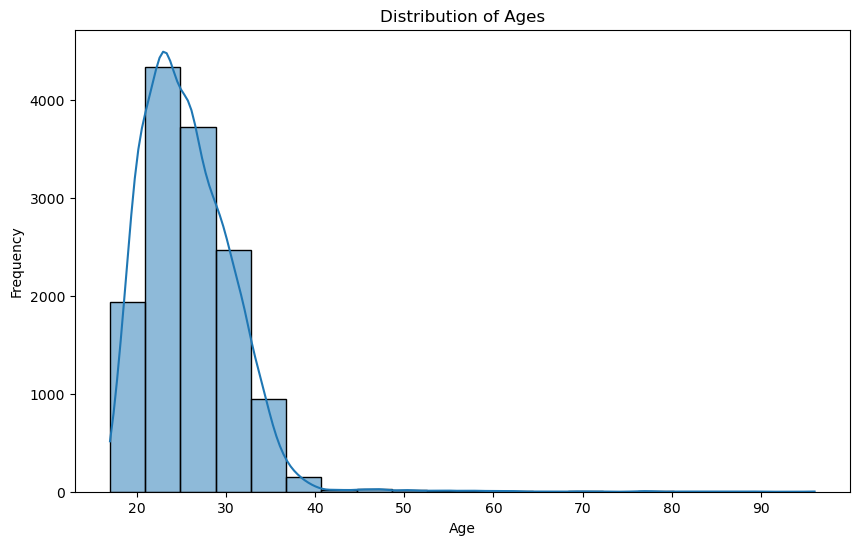

In [9]:
# Visualization 1: Histogram of Ages
plt.figure(figsize=(10, 6))
sns.histplot(df['Age'], bins=20, kde=True)
plt.title('Distribution of Ages')
plt.xlabel('Age')
plt.ylabel('Frequency')
plt.show()

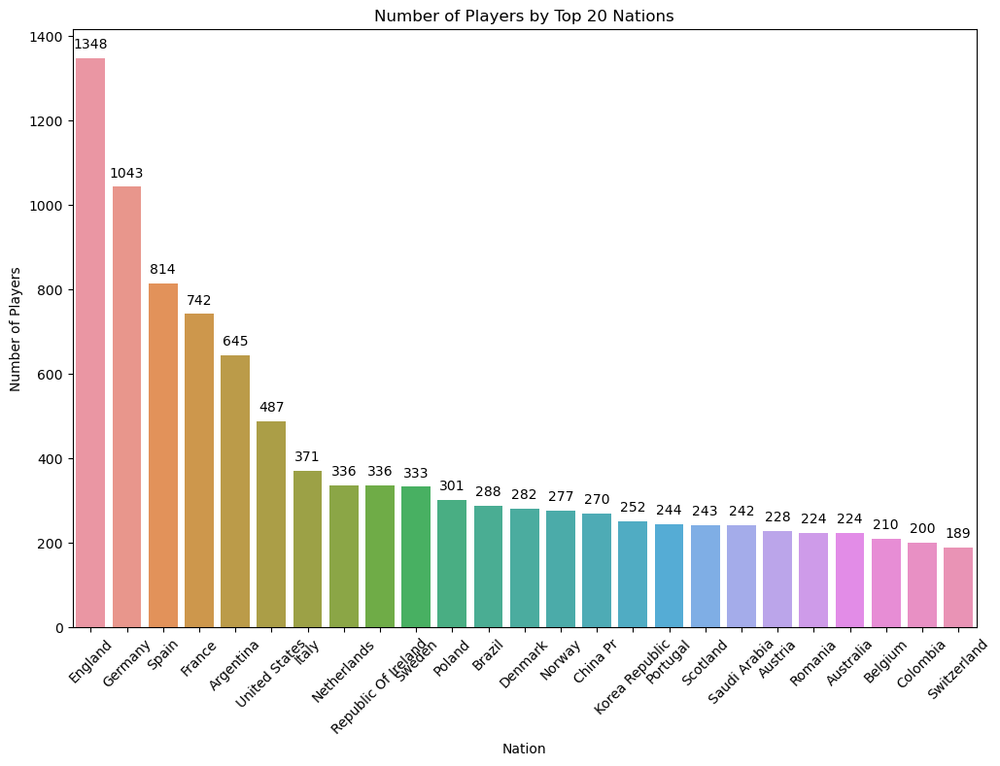

In [10]:
# Visualization 2: Bar chart of Top 25 Nations with numbers on top
top_nations = df['Nation'].value_counts().nlargest(25).index
plt.figure(figsize=(12, 8))
ax = sns.countplot(x='Nation', data=df, order=top_nations)
plt.title('Number of Players by Top 20 Nations')
plt.xlabel('Nation')
plt.ylabel('Number of Players')
plt.xticks(rotation=45)

# Displaying numbers on top of each bar
for p in ax.patches:
    ax.annotate(f'{p.get_height()}', (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center', xytext=(0, 10), textcoords='offset points')

plt.show()


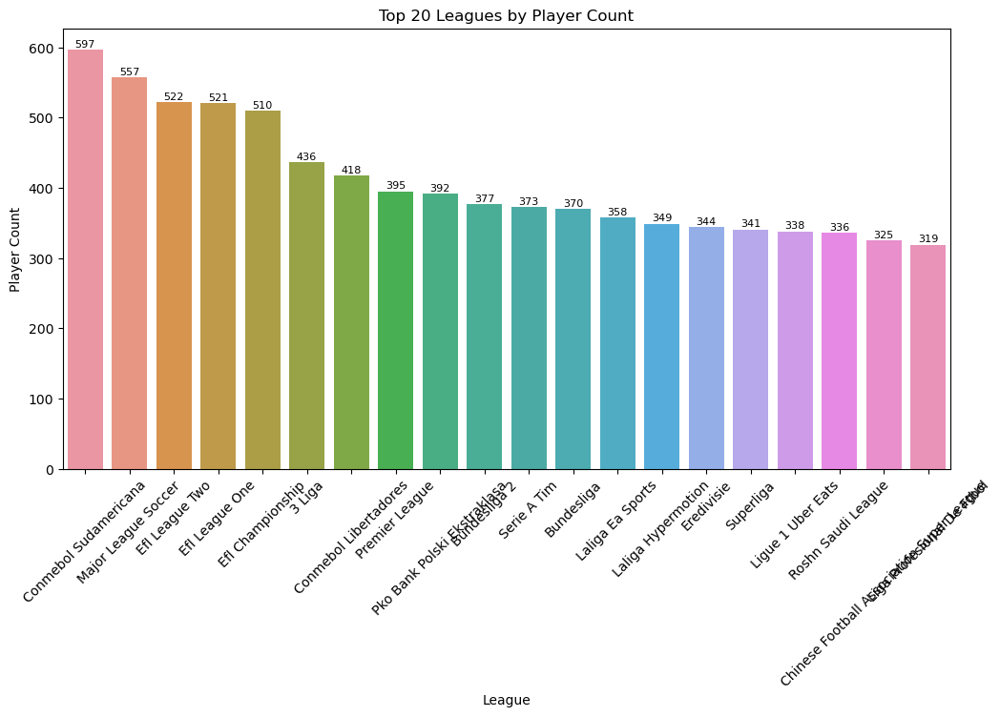

In [11]:
# Visualization 2: Bar Chart - Top 20 Leagues with Player Count
top_leagues = df['League'].value_counts().nlargest(20)
plt.figure(figsize=(12, 6))
bar_plot = sns.barplot(x=top_leagues.index, y=top_leagues.values)
plt.title('Top 20 Leagues by Player Count')
plt.xlabel('League')
plt.ylabel('Player Count')
plt.xticks(rotation=45)

# Add the number of players on top of each bar
for index, value in enumerate(top_leagues.values):
    bar_plot.text(index, value + 1, str(value), ha='center', va='bottom', fontsize=8, color='black')

plt.show()


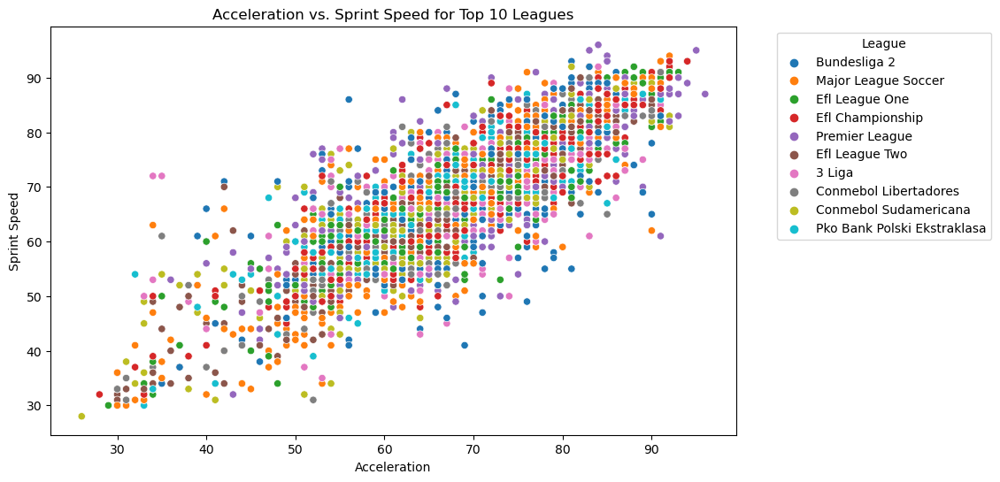

In [12]:
# Visualization 3: Scatter plot of Acceleration vs. Sprint Speed for Top 10 Leagues
top_leagues = df['League'].value_counts().nlargest(10).index
plt.figure(figsize=(10, 6))
sns.scatterplot(x='Acceleration', y='Sprint Speed', data=df[df['League'].isin(top_leagues)], hue='League')
plt.title('Acceleration vs. Sprint Speed for Top 10 Leagues')
plt.xlabel('Acceleration')
plt.ylabel('Sprint Speed')
plt.legend(title='League', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()


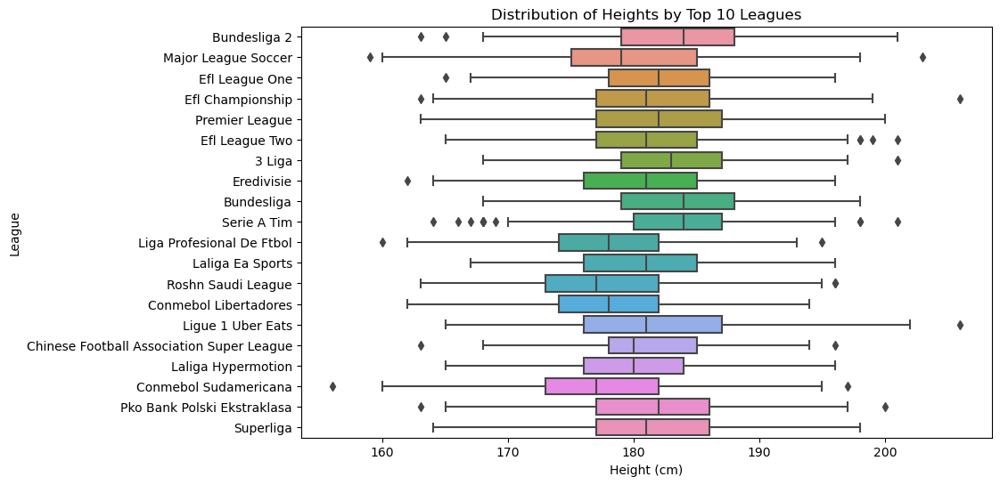

In [13]:
# Extracting numeric values from 'Height' column
df['Height_cm'] = df['Height'].str.extract('(\d+)').astype(float)

# Visualization 4: Box plot of Heights for Top 10 Leagues
top_leagues = df['League'].value_counts().nlargest(20).index
plt.figure(figsize=(10, 6))
sns.boxplot(x='Height_cm', y='League', data=df[df['League'].isin(top_leagues)])
plt.title('Distribution of Heights by Top 10 Leagues')
plt.xlabel('Height (cm)')
plt.ylabel('League')
plt.show()

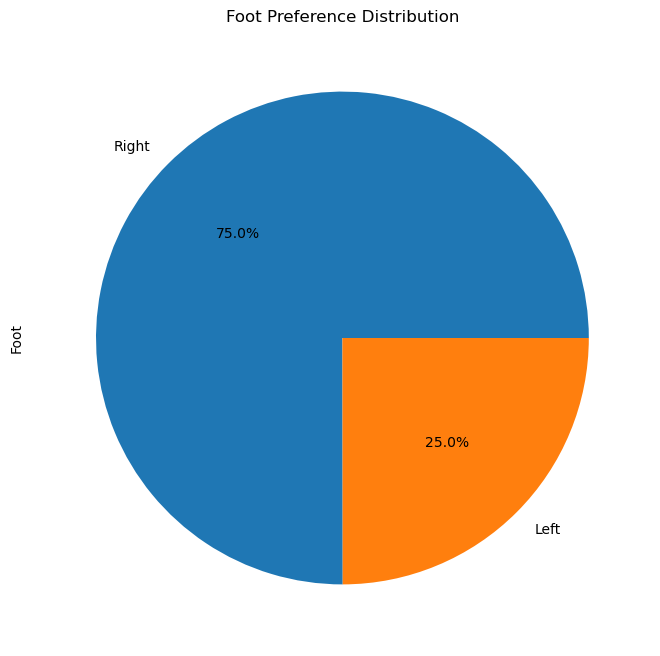

In [14]:
# Visualization 5: Pie chart of Foot preference
plt.figure(figsize=(8, 8))
df['Foot'].value_counts().plot.pie(autopct='%1.1f%%')
plt.title('Foot Preference Distribution')
plt.show()

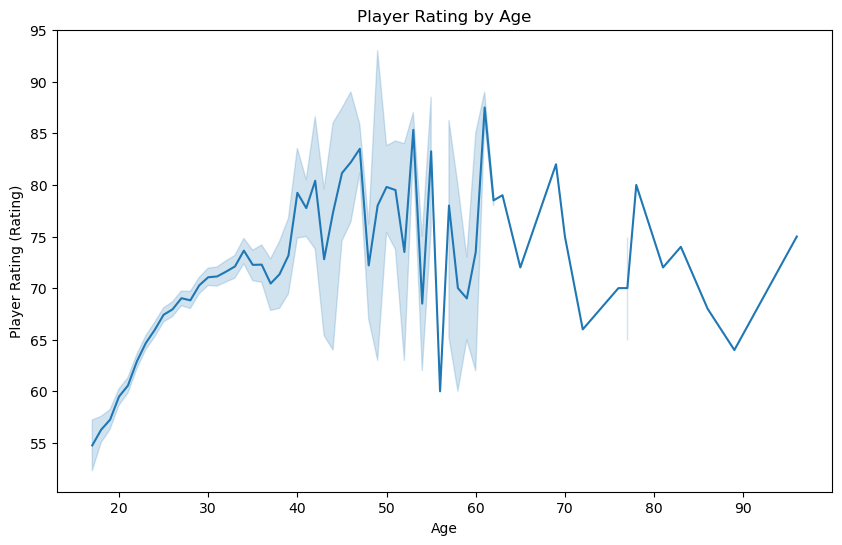

In [15]:
# Visualization 6: Line plot of Player Strength by Age
plt.figure(figsize=(10, 6))
sns.lineplot(x='Age', y='Strength_list', data=df)
plt.title('Player Rating by Age')
plt.xlabel('Age')
plt.ylabel('Player Rating (Rating)')
plt.show()

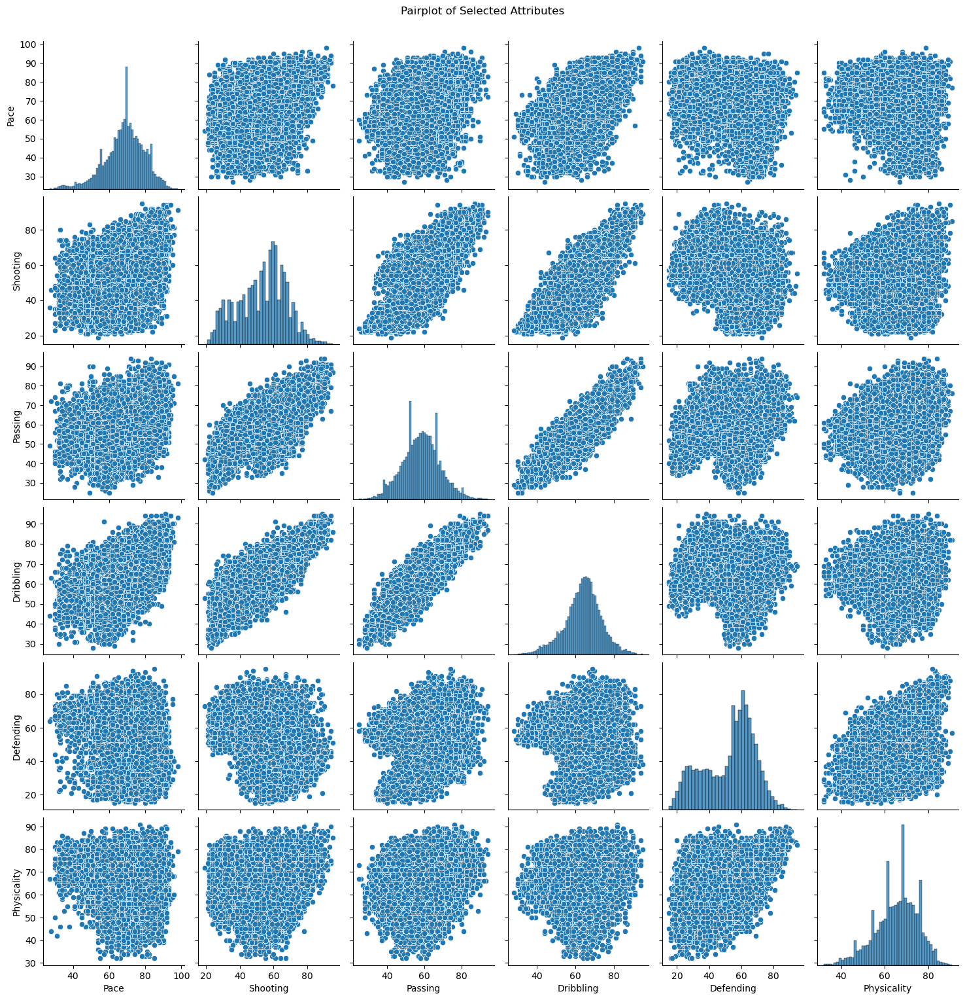

In [16]:
# Visualization 7: Pairplot for selected attributes
attributes = ['Pace', 'Shooting', 'Passing', 'Dribbling', 'Defending', 'Physicality']
sns.pairplot(df[attributes])
plt.suptitle('Pairplot of Selected Attributes', y=1.02)
plt.show()

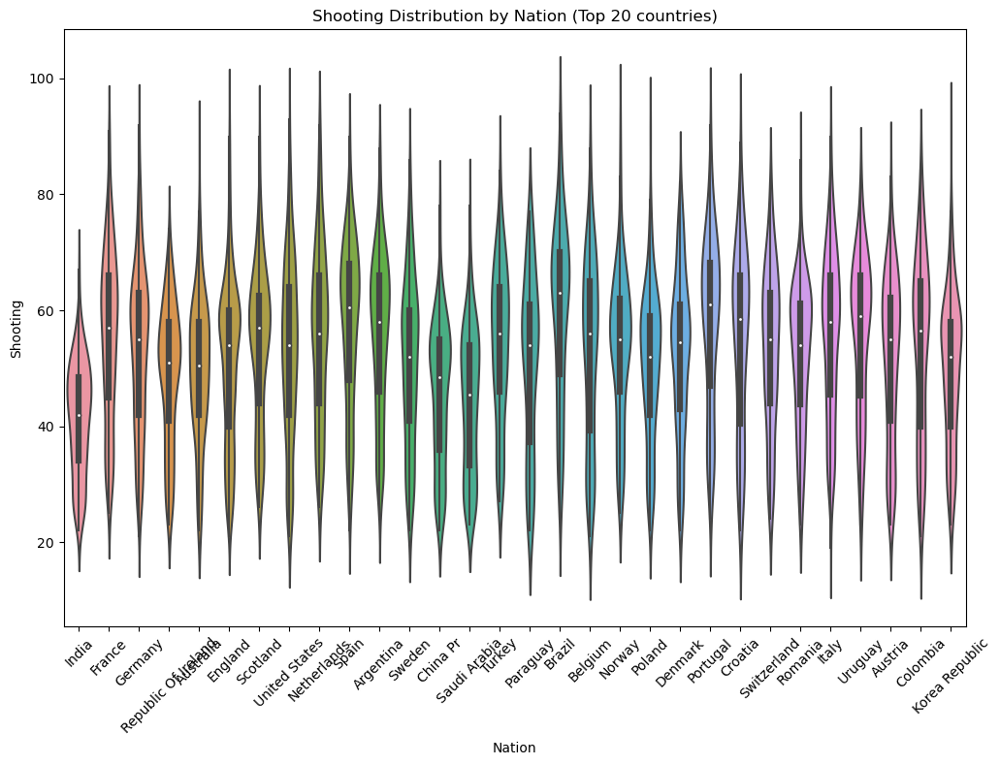

In [17]:
# Get the top 20 countries based on the number of players
top_20_countries = df['Nation'].value_counts().nlargest(30).index

# Filter the DataFrame for only the top 20 countries
df_top_20_countries = df[df['Nation'].isin(top_20_countries)]

# Visualization 8: Violin plot of Shooting by Nation (Top 20 countries)
plt.figure(figsize=(12, 8))
sns.violinplot(x='Nation', y='Shooting', data=df_top_20_countries)
plt.title('Shooting Distribution by Nation (Top 20 countries)')
plt.xlabel('Nation')
plt.ylabel('Shooting')
plt.xticks(rotation=45)
plt.show()

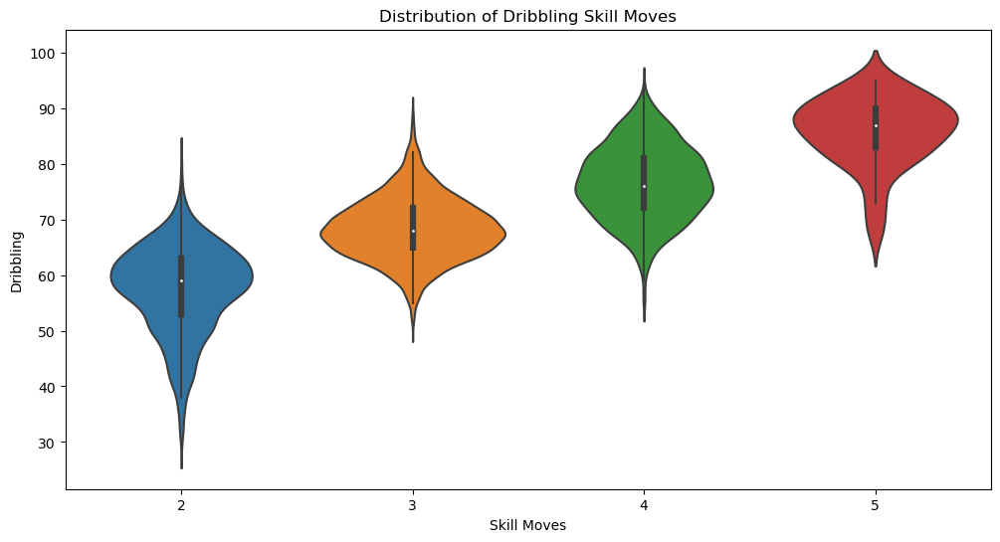

In [18]:
# Visualization 8: Violin Plot - Skill Moves Distribution
plt.figure(figsize=(12, 6))
sns.violinplot(x='Skill Moves', y='Dribbling', data=df)
plt.title('Distribution of Dribbling Skill Moves')
plt.xlabel('Skill Moves')
plt.ylabel('Dribbling')
plt.show()

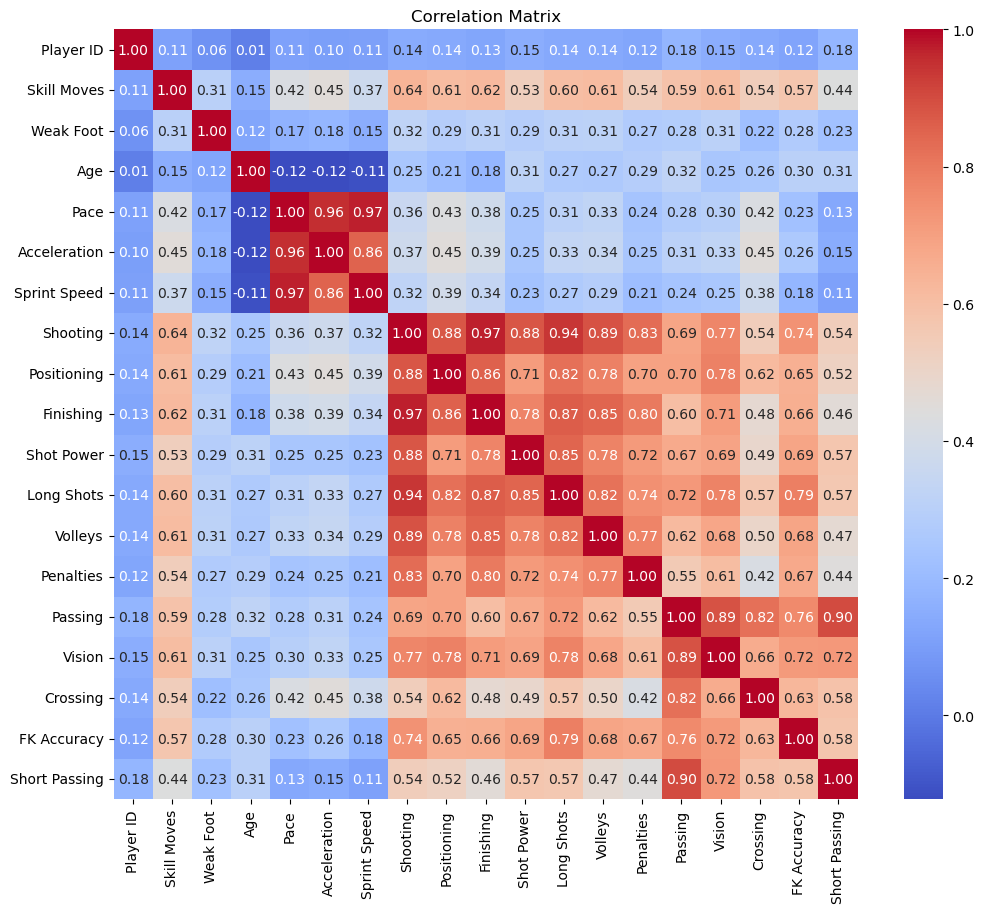

In [19]:
# Visualization 9: Heatmap of Correlation Matrix
correlation_matrix = df.iloc[:,:30].corr()
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Matrix')
plt.show()

In [20]:
# Find the most repeated 30 clubs
top_30_clubs = df['Club'].value_counts().nlargest(30).index

# Filter the DataFrame to include only the top 30 clubs
df_top_30 = df[df['Club'].isin(top_30_clubs)]

# Visualization 2: Plotly Scatter Plot for the top 30 clubs
fig = px.scatter(df_top_30, x="Pace", y="Shooting", color="Club", hover_name="Name")
fig.show()


In [21]:
# Visualization 5: Plotly Express 3D Scatter Plot
fig = px.scatter_3d(df, x='Height', y='Strength_list', z='Stamina', color='Club', size='Pace', hover_name='Name')
fig.show()

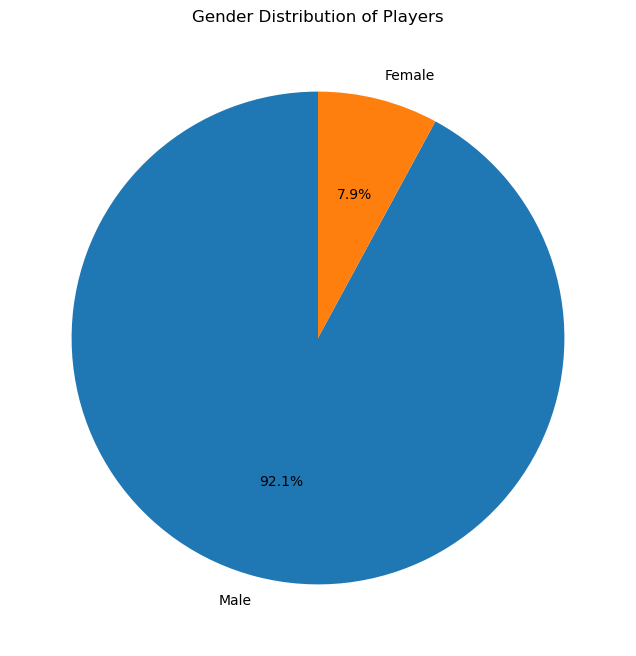

In [22]:
# Visualization 6: Pie Chart - Gender Distribution
gender_distribution = df['gender'].value_counts()
plt.figure(figsize=(8, 8))
plt.pie(gender_distribution, labels=gender_distribution.index, autopct='%1.1f%%', startangle=90)
plt.title('Gender Distribution of Players')
plt.show()

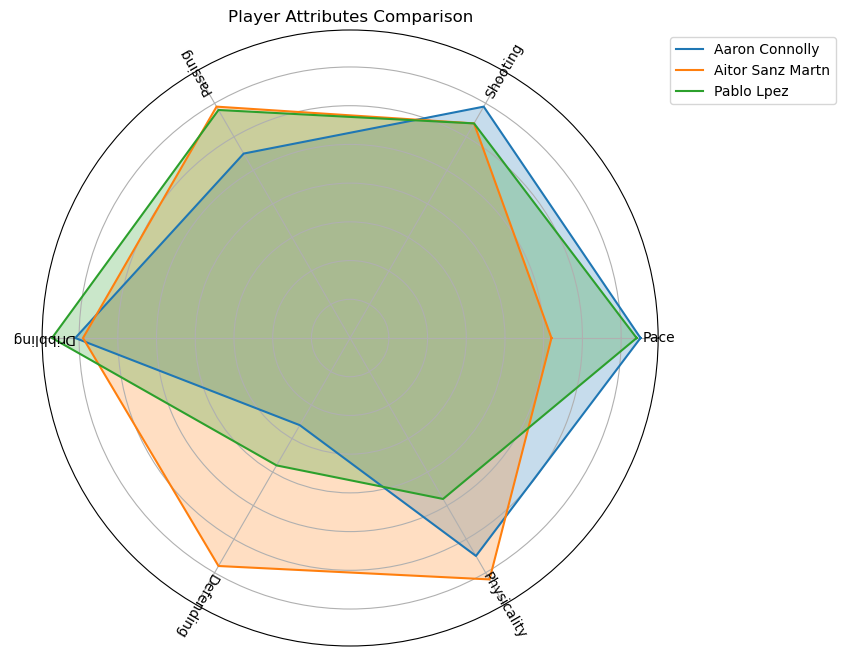

In [23]:
# Visualization 10: Radar Chart - Player Attributes Comparison with Labels
player_attributes_comparison = df.loc[df['Name'].isin(['Aaron Connolly', 'Aitor Sanz Martn', 'Pablo Lpez'])]
attributes_to_compare = ['Pace', 'Shooting', 'Passing', 'Dribbling', 'Defending', 'Physicality']

fig, ax = plt.subplots(figsize=(8, 8), subplot_kw=dict(polar=True))
for player in player_attributes_comparison['Name']:
    values = player_attributes_comparison.loc[player_attributes_comparison['Name'] == player, attributes_to_compare].values.flatten().tolist()
    values += values[:1]  # Close the circle
    angles = [n / float(len(attributes_to_compare)) * 2 * 3.14159 for n in range(len(attributes_to_compare))]
    angles += angles[:1]
    ax.plot(angles, values, label=player)
    ax.fill(angles, values, alpha=0.25)

# Add labels with values at the end of each line
for i, attribute in enumerate(attributes_to_compare):
    angle_rad = i / float(len(attributes_to_compare)) * 2 * 3.14159
    angle_deg = i / float(len(attributes_to_compare)) * 360
    ax.text(angle_rad, ax.get_ylim()[1] + 0.1, attribute, ha='center', va='center', rotation=angle_deg)

ax.set_yticklabels([])
ax.set_xticks(angles[:-1])  # Add this line to define the xticks
ax.set_thetagrids([angle * 180/3.14159 for angle in angles[:-1]], [''] * len(attributes_to_compare))  # Set empty labels
plt.title('Player Attributes Comparison')
plt.legend(loc='upper right', bbox_to_anchor=(1.3, 1))
plt.show()


In [24]:
# Load a world map GeoDataFrame
world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))

# Assuming 'Nation' column in 'df' corresponds to the 'name' column in the world GeoDataFrame
player_counts = df.groupby('Nation').size().reset_index(name='PlayerCount')
merged_df = world.merge(player_counts, left_on='name', right_on='Nation', how='left')

# Set a baseline (you can customize this based on your needs)
baseline_counts = 100
merged_df['PlayerCountDiff'] = merged_df['PlayerCount'] - baseline_counts

# Plot the difference heatmap
fig = px.choropleth(
    merged_df,
    geojson=merged_df.geometry,
    locations=merged_df.index,
    color='PlayerCountDiff',
    hover_name='name',
    title='Player Count Difference from Baseline by Country',
    color_continuous_scale=px.colors.diverging.RdBu,
    projection="natural earth",
    height=600,
)
fig.update_geos(showcountries=True, countrycolor="gray")
fig.show()

In [25]:
import geopandas as gpd
import plotly.express as px

# Load a world map GeoDataFrame
world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))

# Assuming 'df' is your DataFrame containing the player data
# Assuming 'Nation' column in 'df' corresponds to the 'name' column in the world GeoDataFrame
average_age_by_country = df.groupby('Nation')['Age'].mean().reset_index(name='AverageAge')
merged_df_age = world.merge(average_age_by_country, left_on='name', right_on='Nation', how='left')

# Plot the average player age by country
fig = px.choropleth(
    merged_df_age,
    geojson=merged_df_age.geometry,
    locations=merged_df_age.index,
    color='AverageAge',
    hover_name='name',
    title='Average Player Age by Country',
    color_continuous_scale='Viridis',
    projection="natural earth",
    height=600,
)
fig.update_geos(showcountries=True, countrycolor="gray")
fig.show()


In [26]:
import folium
from folium.plugins import MarkerCluster

# Existing player data
data = {
    270735: {'Name': 'Aakash Sangwan', 'Club': 'Chennaiyin Fc', 'Latitude': 13.0827, 'Longitude': 80.2707},
    234290: {'Name': 'Aapo Halme', 'Club': 'Hjk Helsinki', 'Latitude': 60.1695, 'Longitude': 24.9354},
    # Add more players here...
}

# Additional player data
additional_data = {
    259218: {'Name': 'Aaren D\'Silva', 'Club': 'Hyderabad Fc', 'Latitude': 17.3850, 'Longitude': 78.4867},
    275440: {'Name': 'Aaron Akal', 'Club': 'Fc Basel 1893', 'Latitude': 47.5596, 'Longitude': 7.5886},
    270603: {'Name': 'Aaron Basenach', 'Club': 'Kaiserslautern', 'Latitude': 49.4431, 'Longitude': 7.7685},
    236495: {'Name': 'Aaron Bolger', 'Club': 'Cork City', 'Latitude': 51.8985, 'Longitude': -8.4756},
    239910: {'Name': 'Aaron Boupendza', 'Club': 'Fc Cincinnati', 'Latitude': 39.1031, 'Longitude': -84.5120},
    212535: {'Name': 'Aaron Calver', 'Club': 'Gwangju Fc', 'Latitude': 35.1547, 'Longitude': 126.9156},
    225509: {'Name': 'Aaron Collins', 'Club': 'Bristol Rovers', 'Latitude': 51.4840, 'Longitude': -2.5836},
    237286: {'Name': 'Aaron Connolly', 'Club': 'Hull City', 'Latitude': 53.7457, 'Longitude': -0.3367},
    189615: {'Name': 'Aaron Cresswell', 'Club': 'West Ham', 'Latitude': 51.5386, 'Longitude': 0.0662},
    265441: {'Name': 'Aaron Drewe', 'Club': 'Qpr', 'Latitude': 51.5099, 'Longitude': -0.2322},
    242286: {'Name': 'Aaron Drinan', 'Club': 'Leyton Orient', 'Latitude': 51.6552, 'Longitude': 0.1623},
    198543: {'Name': 'Aaron Greene', 'Club': 'Shamrock Rovers', 'Latitude': 53.3376, 'Longitude': -6.2715},
    271971: {'Name': 'Aaron Gurd', 'Club': 'Sydney Fc', 'Latitude': -33.8688, 'Longitude': 151.2093},
    228376: {'Name': 'Aaron Hayden', 'Club': 'Wrexham Afc', 'Latitude': 53.0469, 'Longitude': -3.0476},
    255050: {'Name': 'Aaron Henry', 'Club': 'Crawley Town', 'Latitude': 51.1152, 'Longitude': -0.1831},
    242542: {'Name': 'Aaron Herrera', 'Club': 'Cf Montral', 'Latitude': 45.5017, 'Longitude': -73.5673},
    248808: {'Name': 'Aaron Hickey', 'Club': 'Brentford', 'Latitude': 51.4941, 'Longitude': -0.2503},
    233793: {'Name': 'Aaron Lewis', 'Club': 'Mansfield Town', 'Latitude': 53.1424, 'Longitude': -1.1988},
    222123: {'Name': 'Aaron Long', 'Club': 'Lafc', 'Latitude': 34.0522, 'Longitude': -118.2437},
    256233: {'Name': 'Aaron Manu', 'Club': 'RotWeiss Essen', 'Latitude': 51.4512, 'Longitude': 7.0086},
    225998: {'Name': 'Aaron Mceneff', 'Club': 'Perth Glory', 'Latitude': -31.9505, 'Longitude': 115.8605},
    213127: {'Name': 'Aaron Mcgowan', 'Club': 'Northampton', 'Latitude': 52.2405, 'Longitude': -0.9027},
    261287: {'Name': 'Aaron Mcnally', 'Club': 'Drogheda United', 'Latitude': 53.7162, 'Longitude': -6.3564},
    188621: {'Name': 'Aaron Meijers', 'Club': 'Rkc Waalwijk', 'Latitude': 51.6961, 'Longitude': 5.2940},
    235807: {'Name': 'Aaron Morley', 'Club': 'Bolton', 'Latitude': 53.5806, 'Longitude': -2.4291},
    # Add more players here...
}

# Update the data dictionary with additional player information
data.update(additional_data)

# Create a base map centered at a certain location
m_clubs = folium.Map(location=[30, 0], zoom_start=2)

# Create a MarkerCluster layer for player clubs
marker_cluster_clubs = MarkerCluster().add_to(m_clubs)

# Iterate through the player data and add markers to the MarkerCluster layer
for player_id, player in data.items():
    folium.Marker(
        location=[player['Latitude'], player['Longitude']],
        popup=f"{player['Name']} - {player['Club']}",
    ).add_to(marker_cluster_clubs)

# Save the map to an HTML file
m_clubs.save("player_clubs_map.html")
m_clubs
